In [54]:
import sys
import os
import glob
from collections import defaultdict

import pandas as pd
import numpy as np

sys.path.append("/home/hyunbin/git_repositories/rxrx1-utils")
import rxrx.io as rio

import re

import matplotlib.pyplot as plt
%matplotlib inline

### create dataset

In [6]:
def load_data_cell_perturbation(base_path="/data2/cell_perturbation/train/"):
    """
        return a dictionary
        -keys : sample info
        -values : a list of sample file paths

        sample_info ex

        """
    dataset_dict = dict()

    wells = os.listdir(base_path)
    for well in wells:
        plates = os.listdir(os.path.join(base_path, well))
        for plate in plates:
            images = glob.glob(os.path.join(base_path, well, plate, "*"))
            temp_dict = defaultdict(list)

            for image in images:
                #dirs = os.path.split(image)
                normpath = os.path.normpath(image)
                dirs = normpath.split(os.sep)
                basename = dirs[-1]
                elem = basename.split("_")
                pre = dirs[-3]
                plate = dirs[-2][-1]
                suf = "_".join(elem[:2])
                # channel = elem[2]
                sample_info = "{}_{}_{}".format(pre, plate, suf)
                temp_dict[sample_info].append(image)

            for key, val in temp_dict.items():
                # if len(val) != 6: continue
                dataset_dict[key] = sorted(val)

    return dataset_dict

In [7]:
dataset = load_data_cell_perturbation()

In [8]:
print("{} KB".format(sys.getsizeof(dataset) / 1000))

2621.544 KB


In [9]:
for i, (item) in enumerate(dataset.items()):
    print(item)
    if i%5 == 4: sys.exit()

('HEPG2-01_1_M17_s1', ['/data2/cell_perturbation/train/HEPG2-01/Plate1/M17_s1_w1.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/M17_s1_w2.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/M17_s1_w3.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/M17_s1_w4.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/M17_s1_w5.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/M17_s1_w6.png'])
('HEPG2-01_1_B07_s2', ['/data2/cell_perturbation/train/HEPG2-01/Plate1/B07_s2_w1.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/B07_s2_w2.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/B07_s2_w3.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/B07_s2_w4.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/B07_s2_w5.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/B07_s2_w6.png'])
('HEPG2-01_1_I11_s1', ['/data2/cell_perturbation/train/HEPG2-01/Plate1/I11_s1_w1.png', '/data2/cell_perturbation/train/HEPG2-01/Plate1/I11_s1_w2.png', '/data2/cell_perturbation/train/H

SystemExit: 

In [10]:
print(len(dataset.values()))

81224


### load metadata

In [11]:
metadata = rio.combine_metadata()
print(metadata.shape)
metadata.head()

(125510, 8)


,cell_type,dataset,experiment,plate,sirna,site,well,well_type
id_code,,,,,,,,
HEPG2-08_1_B02,HEPG2,test,HEPG2-08,1,1138.0,1,B02,negative_control
HEPG2-08_1_B02,HEPG2,test,HEPG2-08,1,1138.0,2,B02,negative_control
HEPG2-08_1_B03,HEPG2,test,HEPG2-08,1,NaN,1,B03,treatment
HEPG2-08_1_B03,HEPG2,test,HEPG2-08,1,NaN,2,B03,treatment
HEPG2-08_1_B04,HEPG2,test,HEPG2-08,1,NaN,1,B04,treatment


In [12]:
print("{} KB".format(sys.getsizeof(metadata) / 1000))

51304.332 KB


In [27]:
def merge_all_data_to_metadata(datalist, metadata):
    
    concat_data_df = None
    for i, dataset in enumerate(datalist):
        dataset_df = pd.DataFrame(dataset).transpose()
        dataset_df.columns = ['c{}'.format(i) for i in range(1, 7)]

        rev_id_code = []
        rev_site = []
        for i in dataset_df.index.values.tolist():
            elem = i.split("_")

            temp_id = "_".join(elem[:-1])
            temp_site = int(elem[-1][1])

            rev_id_code.append(temp_id)
            rev_site.append(temp_site)

        dataset_df['id_code'] = rev_id_code
        dataset_df['site'] = rev_site

        dataset_df.reset_index(inplace=True)
        dataset_df.drop('index', axis=1, inplace=True)
        
        if i == 0:
            concat_data_df = dataset_df
        else:
            concat_data_df = pd.concat([concat_data_df, dataset_df])
        
    merged_data = metadata.merge(concat_data_df, how='left', on=['id_code', 'site'])
    merged_data['sirna'] = [str(i) for i in merged_data['sirna'].values.tolist()]
    return merged_data


In [ ]:
def plot_cell_sirna(merged_data, cell, sirna, figsize=10):
    plt.figure(figsize=(figsize, figsize))
    matched_data_list = []
    
    regex = re.compile(r'{}_*'.format(cell))
    
    
    
    

In [17]:
train = load_data_cell_perturbation(base_path="/data2/cell_perturbation/train/")
test = load_data_cell_perturbation(base_path="/data2/cell_perturbation/test/")

In [28]:
merged_data = merge_all_data_to_metadata([train, test], metadata)
print(merged_data.shape)
merged_data.head()

(125510, 15)


,id_code,cell_type,dataset,experiment,plate,sirna,site,well,well_type,c1,c2,c3,c4,c5,c6
0,HEPG2-08_1_B02,HEPG2,test,HEPG2-08,1,1138.0,1,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...
1,HEPG2-08_1_B02,HEPG2,test,HEPG2-08,1,1138.0,2,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...
2,HEPG2-08_1_B03,HEPG2,test,HEPG2-08,1,nan,1,B03,treatment,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...
3,HEPG2-08_1_B03,HEPG2,test,HEPG2-08,1,nan,2,B03,treatment,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...
4,HEPG2-08_1_B04,HEPG2,test,HEPG2-08,1,nan,1,B04,treatment,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...


In [29]:
print("{} KB".format(sys.getsizeof(merged_data) / 1000))

146462.598 KB


In [31]:
filtered = merged_data[merged_data['id_code'].str.contains('HEPG2')]
filtered = filtered[filtered['sirna'].str.contains('1138')]
filtered

,id_code,cell_type,dataset,experiment,plate,sirna,site,well,well_type,c1,c2,c3,c4,c5,c6
0,HEPG2-08_1_B02,HEPG2,test,HEPG2-08,1,1138.0,1,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...
1,HEPG2-08_1_B02,HEPG2,test,HEPG2-08,1,1138.0,2,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...,/data2/cell_perturbation/test/HEPG2-08/Plate1/...
616,HEPG2-08_2_B02,HEPG2,test,HEPG2-08,2,1138.0,1,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...
617,HEPG2-08_2_B02,HEPG2,test,HEPG2-08,2,1138.0,2,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...,/data2/cell_perturbation/test/HEPG2-08/Plate2/...
1232,HEPG2-08_3_B02,HEPG2,test,HEPG2-08,3,1138.0,1,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...
1233,HEPG2-08_3_B02,HEPG2,test,HEPG2-08,3,1138.0,2,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...,/data2/cell_perturbation/test/HEPG2-08/Plate3/...
1848,HEPG2-08_4_B02,HEPG2,test,HEPG2-08,4,1138.0,1,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...
1849,HEPG2-08_4_B02,HEPG2,test,HEPG2-08,4,1138.0,2,B02,negative_control,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...,/data2/cell_perturbation/test/HEPG2-08/Plate4/...
2462,HEPG2-09_1_B02,HEPG2,test,HEPG2-09,1,1138.0,1,B02,negative_control,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...
2463,HEPG2-09_1_B02,HEPG2,test,HEPG2-09,1,1138.0,2,B02,negative_control,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...,/data2/cell_perturbation/test/HEPG2-09/Plate1/...


In [43]:
def filter_data_with_cell_sirna(merged_data, cell ,sirna):
    """
    return filtered DataFrame from merged_data (produced from 'load_dataset.merge_all_data_to_metadata')

    --------------
    arguments

    cell: str or list
    sirna: int or str or list

    ---------------
    Examples

    filtered_HEPG2_998 = filter_data_with_cell_sirna(merged_data, 'HEPG2', 998)

    filtered_some_condition = filter_data_with_cell_sirna(merged_data, ['HEPG2', 'HUVEC'], [i for i in range(1108, 1138)])  #1108 ~ 1137 : positive control
    """
    if isinstance(cell, list):
        cell = '|'.join(cell)

    if isinstance(sirna, list):
        sirna = '|'.join(map(str, sirna))
    else:
        sirna = str(sirna)
        
    filtered = merged_data[merged_data['id_code'].str.contains(cell)]
    filtered = filtered[filtered['sirna'].str.contains(sirna)]

    return filtered

In [46]:
filtered_HEPG2_998 = filter_data_with_cell_sirna(merged_data, 'HEPG2', 998)

In [47]:
filtered_HEPG2_998

,id_code,cell_type,dataset,experiment,plate,sirna,site,well,well_type,c1,c2,c3,c4,c5,c6
46186,HEPG2-01_4_C06,HEPG2,train,HEPG2-01,4,998.0,1,C06,treatment,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...
46187,HEPG2-01_4_C06,HEPG2,train,HEPG2-01,4,998.0,2,C06,treatment,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...
49056,HEPG2-02_4_L11,HEPG2,train,HEPG2-02,4,998.0,1,L11,treatment,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...
49057,HEPG2-02_4_L11,HEPG2,train,HEPG2-02,4,998.0,2,L11,treatment,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...
51354,HEPG2-03_4_H16,HEPG2,train,HEPG2-03,4,998.0,1,H16,treatment,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...
51355,HEPG2-03_4_H16,HEPG2,train,HEPG2-03,4,998.0,2,H16,treatment,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...
53776,HEPG2-04_4_G17,HEPG2,train,HEPG2-04,4,998.0,1,G17,treatment,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...
53777,HEPG2-04_4_G17,HEPG2,train,HEPG2-04,4,998.0,2,G17,treatment,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...,/data2/cell_perturbation/train/HEPG2-04/Plate4...
54850,HEPG2-05_2_D04,HEPG2,train,HEPG2-05,2,998.0,1,D04,treatment,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...
54851,HEPG2-05_2_D04,HEPG2,train,HEPG2-05,2,998.0,2,D04,treatment,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...,/data2/cell_perturbation/train/HEPG2-05/Plate2...


In [51]:
filtered_multiple = filter_data_with_cell_sirna(merged_data, 'HEPG2', [998, 1001])
filtered_multiple

,id_code,cell_type,dataset,experiment,plate,sirna,site,well,well_type,c1,c2,c3,c4,c5,c6
46186,HEPG2-01_4_C06,HEPG2,train,HEPG2-01,4,998.0,1,C06,treatment,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...
46187,HEPG2-01_4_C06,HEPG2,train,HEPG2-01,4,998.0,2,C06,treatment,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...
46514,HEPG2-01_4_J16,HEPG2,train,HEPG2-01,4,1001.0,1,J16,treatment,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...
46515,HEPG2-01_4_J16,HEPG2,train,HEPG2-01,4,1001.0,2,J16,treatment,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...,/data2/cell_perturbation/train/HEPG2-01/Plate4...
48782,HEPG2-02_4_F06,HEPG2,train,HEPG2-02,4,1001.0,1,F06,treatment,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...
48783,HEPG2-02_4_F06,HEPG2,train,HEPG2-02,4,1001.0,2,F06,treatment,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...
49056,HEPG2-02_4_L11,HEPG2,train,HEPG2-02,4,998.0,1,L11,treatment,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...
49057,HEPG2-02_4_L11,HEPG2,train,HEPG2-02,4,998.0,2,L11,treatment,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...,/data2/cell_perturbation/train/HEPG2-02/Plate4...
51110,HEPG2-03_4_C04,HEPG2,train,HEPG2-03,4,1001.0,1,C04,treatment,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...
51111,HEPG2-03_4_C04,HEPG2,train,HEPG2-03,4,1001.0,2,C04,treatment,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...,/data2/cell_perturbation/train/HEPG2-03/Plate4...


In [57]:
def plot_cell_sirna(filtered_data, figsize=10):
    data_num = len(filtered_data)
    row_num = (data_num // 4) + 1

    plt.figure(figsize=(figsize, figsize*row_num))

    for i in range(data_num):
        plt.subplot(row_num, 4, i+1)
        img_paths = filtered_data.iloc[i, -6:].tolist()

        img_6channel = rio.load_images_as_tensor(img_paths)
        img_as_rgb = rio.convert_tensor_to_rgb(img_6channel)
        plt.title(filtered_data.iat[i, 0])
        plt.imshow(img_as_rgb)

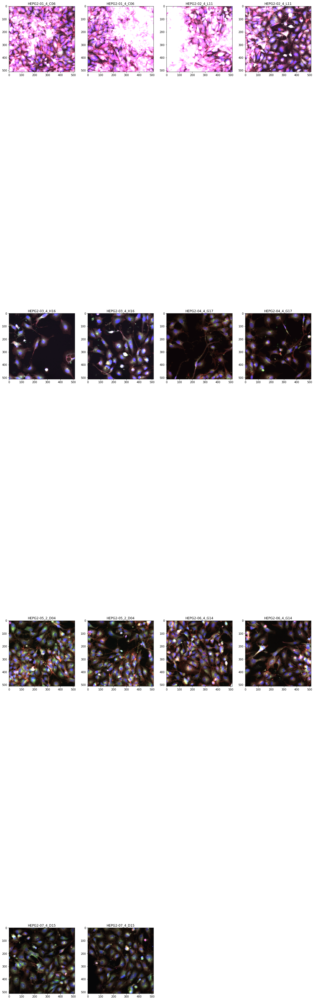

In [58]:
plot_cell_sirna(filtered_HEPG2_998, figsize=20)

In [59]:
filtered_nc = filter_data_with_cell_sirna(merged_data, 'HEPG2', 1138)

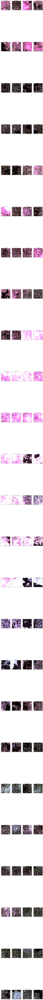

In [60]:
plot_cell_sirna(filtered_nc, figsize=20)